In [1]:
import numpy as np
import jax.numpy as jnp
import jax


from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt
import nmu
from circuitmap import NeuralDemixer

import sys
sys.path.append('../')
import grid_utils as util

plt.rcParams['figure.dpi'] = 300

/Users/Bantin/anaconda3/envs/circuitmap/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Fig 1

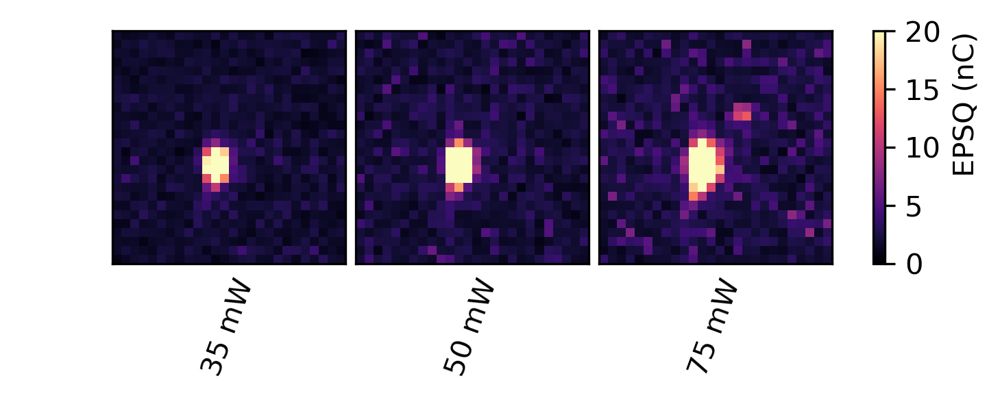

In [2]:
data_path = '../data/marta/IV_injected_sparse/preprocessed/220214_cell2_mg_A_planes.npz'
dat = np.load(data_path, allow_pickle='True')

pscs, I, L = dat['psc'], dat['I'], dat['L']
y = pscs.sum(1)
grid_mean, _, num_stims = util.make_suff_stats(y, I, L)


fig = plt.figure(figsize=(6, 0.75 * 2), dpi=300, facecolor='white')

util.plot_multi_means(fig,
    [grid_mean], np.arange(1),
#     map_names=['subtracted'],
    cmaps=['magma', 'magma'],
    cbar_labels=['EPSQ (nC)'],
    vranges=[(0,20)],
    powers=np.unique(I))

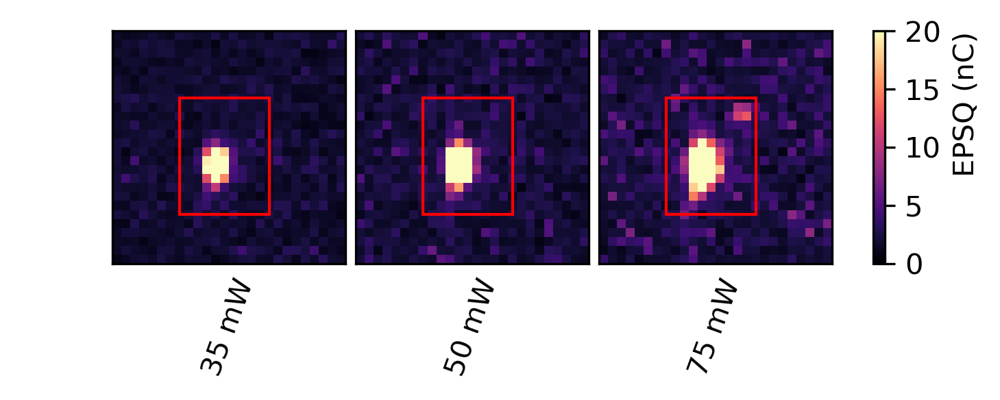

In [3]:
psc_tensor = util.make_psc_tensor(pscs, I, L)
ps = np.arange(3)
xs = np.arange(5,18)
ys = np.arange(7,17)
zs = -1
t_max = 900
y_idx = 6
x_offset = 4

P, X, Y, Z = np.meshgrid(ps, xs, ys, zs, indexing='ij')
roi_tensor = psc_tensor[P,X,Y,Z,:,0:t_max]


# plot map then add ROI
fig = plt.figure(figsize=(6, 0.75 * 2), dpi=300, facecolor='white')

util.plot_multi_means(fig,
    [grid_mean], np.arange(1),
#     map_names=['subtracted'],
    cmaps=['magma', 'magma'],
    cbar_labels=['EPSQ (nC)'],
    vranges=[(0,20)],
    powers=np.unique(I))

axs = fig.axes
from matplotlib.patches import Rectangle
rects = [Rectangle((ys[0],xs[0]), len(ys), len(xs), edgecolor='r', facecolor='None') for _ in range(3)]

for (ax, rect) in zip(axs[1:4], rects):
    ax.add_patch(rect)



## Visualize ROI

We expand the ROI to explicitly include a connected cell. Double check here that the ROI is where we want. 

Text(0, 0.5, 'current (nA)')

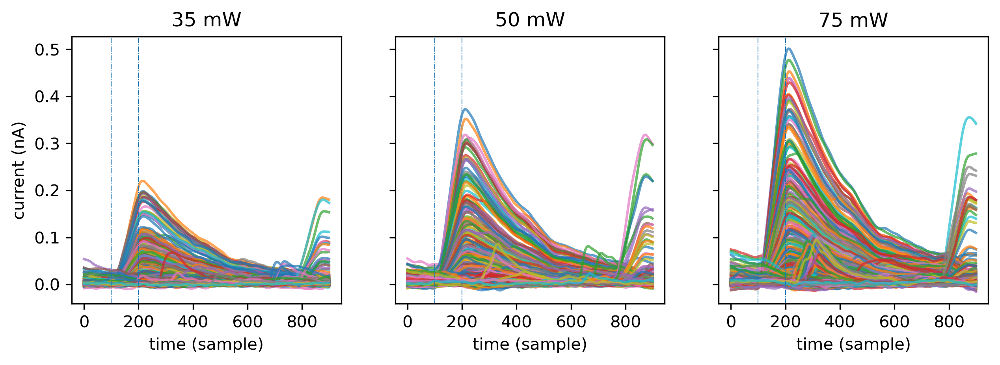

In [69]:
# import seaborn as sns

powers = np.unique(I)
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10,3), sharey=True, dpi=300, sharex=True)
for i in range(3):
        axs[i].plot(roi_tensor[i,...].reshape(-1,t_max).T, alpha=0.7,)
        axs[i].axvline(x=100, linestyle='-.', linewidth=0.5)
        axs[i].axvline(x=200, linestyle='-.', linewidth=0.5)
        
        axs[i].set_title('%d mW' % powers[i])
        axs[i].set_xlabel('time (sample)')
axs[0].set_ylabel('current (nA)')

## Fig 2

- run parafac separately across all depths, powers

In [59]:
def _svd_estimate(tensor, rank=1):
    dims = tensor.shape
    ntimesteps = dims[-1]
    unfolded = tensor.reshape(-1, ntimesteps)
    U, S, VT = np.linalg.svd(unfolded)
    est =  (U[:, :rank] * S[:rank]) @ VT[:rank,:]
    return est.reshape(dims)
    

def _nmu_estimate(tensor, rank=1):
    dims = tensor.shape
    ntimesteps = dims[-1]
    unfolded = tensor.reshape(-1, ntimesteps)
    factors  = nmu.recursive_nmu(np.maximum(unfolded, 0), r=rank)
    est = np.zeros_like(unfolded)
    for (u, v) in factors:
        est += np.outer(u, v)
    return est.reshape(dims)
    

def _parafac_estimate(tensor, rank=1):
    nx, ny, ntrials_curr, ntimesteps = tensor.shape
    reshaped = tensor.reshape(-1, ntrials_curr, ntimesteps)
    cptensor = parafac(np.maximum(reshaped, 0),
                               rank=rank,)

    return tl.cp_to_tensor(cptensor).reshape(nx, ny, ntrials_curr, ntimesteps)


def estimate_photocurrents(roi_tensor, separate_by_powers=True, rank=1, l2_reg=0.0, method='nmu'):

    _algs = dict(
        nmu=_nmu_estimate,
        parafac=_parafac_estimate,
        svd=_svd_estimate
    )
    if method not in _algs:
        raise ValueError('method must be one of %s' % [x for x in _algs.keys()])

    npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape


    subtracted = np.copy(roi_tensor)
    full_est = np.copy(roi_tensor)
    
    for z_idx in range(nz):

        for power_idx in range(npowers):

            # extract current tensor we're working with. Different powers
            # can have different numbers of trials, which are marked by np.nan
            try:
                ntrials_curr = np.where(np.isnan(roi_tensor[power_idx, 0, 0, 0, :, 0]))[0][0]
            except IndexError:
                ntrials_curr = ntrials

            # This forms an index to extract a particular (power, trials, plane) combination
            _slice = np.s_[power_idx, :, :, z_idx, 0:ntrials_curr, :] 
            tensor_curr = roi_tensor[_slice]

            # Call one of our implemented methods on the data tensor
            est = _algs[method](tensor_curr, rank=rank)

            subtracted[_slice] = roi_tensor[_slice] - est
            full_est[_slice] = est


    return full_est, subtracted

def traces_tensor_to_map(tensor):
    return np.nansum(np.nanmean(tensor, axis=-1), axis=-1)

def plot_subtraction(roi_tensor, est, subtracted_roi_tensor,
        order=None, num_plots=30, power_idx=-1, ylim=None):
    npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape
    roi_traces, est_traces, subtracted_traces = [x[-1,...].reshape(-1, ntrials, ntimesteps)
        for x in [roi_tensor, est, subtracted_roi_tensor]]

    if order is None:
        mean_map_raw = traces_tensor_to_map(roi_traces)
        order = np.argsort(mean_map_raw)[::-1]

    fig, axs = plt.subplots(nrows=num_plots, ncols=3, figsize=(10,num_plots*1.5), sharey=True, dpi=300, sharex=True)

    for i in range(num_plots):
        idx = order[i]
        axs[i, 0].plot(roi_traces[idx].T)
        axs[i, 1].plot(est_traces[idx].T)
        axs[i, 2].plot(subtracted_traces[idx].T)

        if ylim is not None:
            for j in range(3):
                axs[i,j].set_ylim(*ylim)

def plot_subtraction_comparison(roi_tensor, ests, subtracted_roi_tensors, demixed_roi_tensors,
        colors=['red', 'blue'], order=None, num_plots=30, power_idx=-1, ylims=None, override_sharey=False):

    sharey=True
    if ylims is not None:
        sharey=False

    if override_sharey is not None:
        sharey=override_sharey


    fig, axs = plt.subplots(nrows=num_plots, ncols=4, figsize=(10,num_plots*1.5),
        sharey=sharey, dpi=300, sharex=True, facecolor='white')
    npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape

    # get order from raw traces
    roi_traces = roi_tensor[power_idx,...].reshape(-1, ntrials, ntimesteps)
    if order is None:
        mean_map_raw = traces_tensor_to_map(roi_traces)
        order = np.argsort(mean_map_raw)[::-1]

    # plot raw traces outside of the loop over subtraction methods
    for i in range(num_plots):
        idx = order[i]
        axs[i, 0].plot(roi_traces[idx].T)

    # title each column
    titles = ['raw', 'est', 'subtracted', 'demixed']
    for j in range(4):
        axs[0,j].set_title(titles[j])

    # iterate over maps corresponding to different subtraction methods, plot each
    # in a different color
    for (est, subtracted_roi_tensor, demixed_tensor, color) in zip(
        ests, subtracted_roi_tensors, demixed_roi_tensors, colors):

        

        est_traces, subtracted_traces, demixed_traces = [x[power_idx,...].reshape(-1, ntrials, ntimesteps)
            for x in [est, subtracted_roi_tensor, demixed_tensor]]
        
        for i in range(num_plots):
            idx = order[i]
            axs[i, 1].plot(est_traces[idx].T, color=color, linewidth=0.5)
            axs[i, 2].plot(subtracted_traces[idx].T, color=color, linewidth=0.5)
            axs[i, 3].plot(demixed_traces[idx].T, color=color, linewidth=0.5)

            if ylims is not None:
                for j in range(4):
                    axs[i,j].set_ylim(*ylims[j])

    return fig, axs

        
def demix_roi_traces(roi_tensor, demixer_checkpoint):
    # load demixer
    demixer = NeuralDemixer(path=demixer_checkpoint)
    dims = roi_tensor.shape
    ntimesteps = dims[-1]
    raw_traces = roi_tensor.reshape(-1, ntimesteps)
    demixed_traces = util.denoise_pscs_in_batches(raw_traces, demixer)
    return demixed_traces.reshape(dims)





In [56]:
est_nmu, subtracted_nmu = estimate_photocurrents(roi_tensor, rank=1, method='nmu')
est_svd, subtracted_svd = estimate_photocurrents(roi_tensor, rank=1, method='svd')

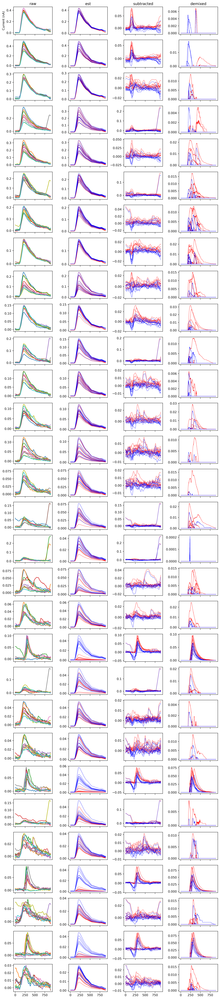

In [60]:
demixer_checkpoint = "/Users/Bantin/Documents/Columbia/Projects/2p-opto/circuit_mapping/demixers/nwd_ee_ChroME1.ckpt"
subtracted_demixed_nmu = demix_roi_traces(subtracted_nmu, demixer_checkpoint)
subtracted_demixed_svd = demix_roi_traces(subtracted_svd, demixer_checkpoint)

fig, axs = plot_subtraction_comparison(roi_tensor, [est_nmu, est_svd], [subtracted_nmu, subtracted_svd],
    [subtracted_demixed_nmu, subtracted_demixed_svd],
    # ylims=[(-0.00, 0.09,), (-0.00, 0.09), (-0.02, 0.05), (-0.02, 0.05)],
    override_sharey=False)
axs[0,0].set_ylabel('Current (nA)')

plt.tight_layout()

**Plot demixed + subtracted maps**

Hard to tell if the demixed residual shapes are reasonable. Maybe map across powers will be informative?

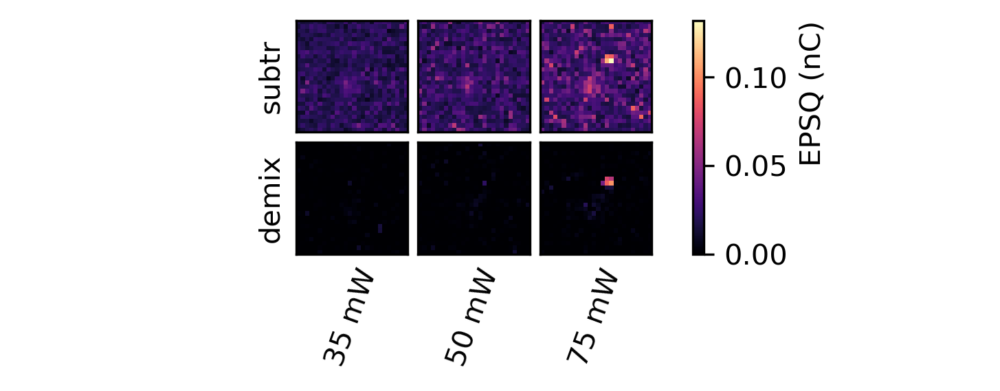

In [37]:


psc_tensor_subtracted = psc_tensor.copy()
psc_tensor_subtracted[P,X,Y,Z,:,0:t_max] = subtracted_nmu
mean_map_subtracted = traces_tensor_to_map(psc_tensor_subtracted)

psc_tensor_demixed = demix_roi_traces(psc_tensor_subtracted, demixer_checkpoint)
mean_map_demixed = traces_tensor_to_map(psc_tensor_demixed)

fig = plt.figure(figsize=(6, 0.75 * 2), dpi=300, facecolor='white')

util.plot_multi_means(fig,
    [np.concatenate((mean_map_subtracted, mean_map_demixed), axis=-1)], np.arange(2),
#     map_names=['subtracted'],
    cmaps=['magma', 'magma'],
    cbar_labels=['EPSQ (nC)'],
    zlabels=['subtr', 'demix'],
    powers=np.unique(I))

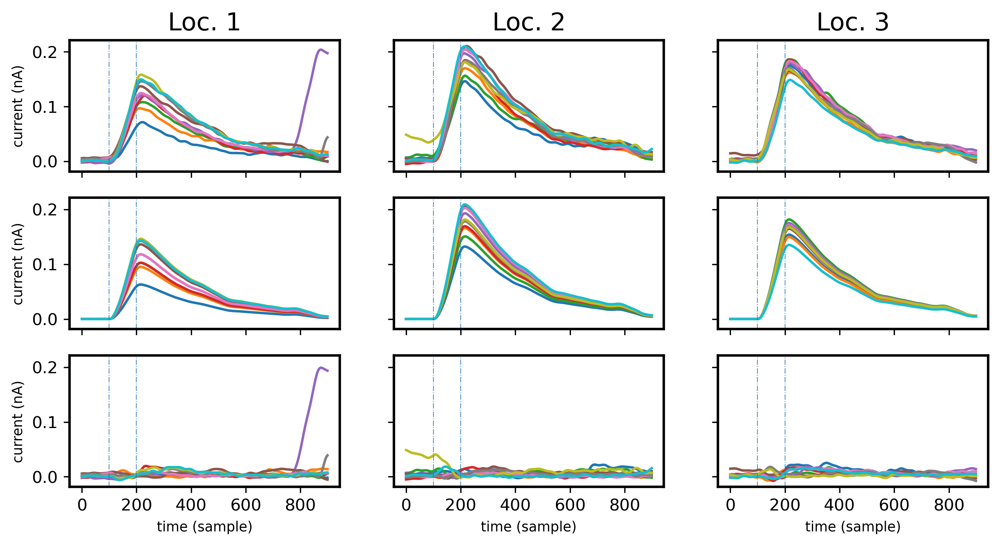

In [21]:
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(10,5), sharey=True, dpi=300, sharex=True)
y_idx = 3
x_offset = 4

for i in range(3):
        
        # plot raw
        axs[0, i].plot(roi_tensor[-1,i+x_offset,y_idx,...].reshape(-1,t_max).T)
        axs[0, i].axvline(x=100, linestyle='-.', linewidth=0.5, alpha=0.8)
        axs[0, i].axvline(x=200, linestyle='-.', linewidth=0.5, alpha=0.8)
        
        axs[0, i].set_title('Loc. %d' % (i + 1))
        axs[0, 0].set_ylabel('current (nA)', fontsize='small')
        
        # plot estimate
        axs[1, i].plot(est_roi_tensor[-1,i+x_offset,y_idx,...].reshape(-1,t_max).T)
        axs[1, i].axvline(x=100, linestyle='-.', linewidth=0.5, alpha=0.8)
        axs[1, i].axvline(x=200, linestyle='-.', linewidth=0.5, alpha=0.8)
        axs[1, 0].set_ylabel('current (nA)', fontsize='small')
        
        # plot subtracted
        axs[2, i].plot(subtracted_roi_tensor[-1,i+x_offset,y_idx,...].reshape(-1,t_max).T)
        axs[2, i].axvline(x=100, linestyle='-.', linewidth=0.5, alpha=0.8)
        axs[2, i].axvline(x=200, linestyle='-.', linewidth=0.5, alpha=0.8)
        
        axs[2, 0].set_ylabel('current (nA)', fontsize='small')
        
        axs[2, i].set_xlabel('time (sample)', fontsize='small')
# axs[0].set_ylabel('current (nA)')

In [8]:
psc_tensor_subtracted = psc_tensor.copy()
psc_tensor_subtracted[P,X,Y,Z,:,0:t_max] = subtracted_roi_tensor
mean_map_subtracted = np.nansum(np.nanmean(psc_tensor_subtracted, axis=-1), axis=-1)

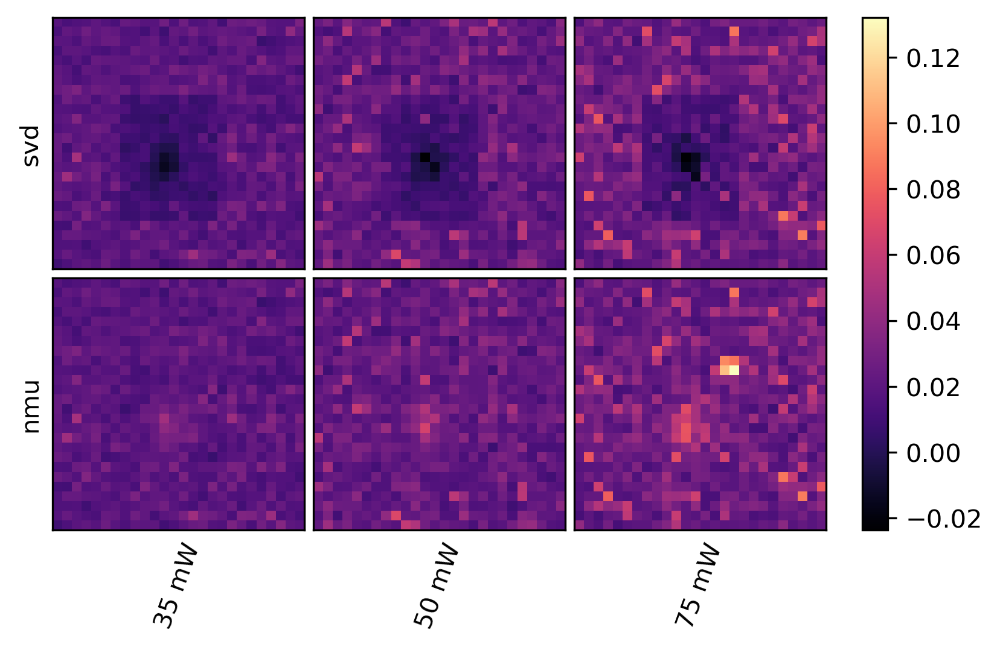

In [63]:

methods = ['svd', 'nmu']
corrected_maps = []

for method in methods:
    est_roi_tensor, subtracted_roi_tensor = estimate_photocurrents(roi_tensor, rank=1, method=method)
    psc_tensor_subtracted = psc_tensor.copy()
    psc_tensor_subtracted[P,X,Y,Z,:,0:t_max] = subtracted_roi_tensor
    mean_map_subtracted = np.nansum(np.nanmean(psc_tensor_subtracted, axis=-1), axis=-1)
    corrected_maps.append(mean_map_subtracted)

stacked = np.concatenate(corrected_maps, axis=-1)
fig = plt.figure(figsize=(6, 0.75 * 5), dpi=300, facecolor='white')

util.plot_multi_means(fig,
    [stacked], np.arange(2),
    zlabels=methods,
    # map_names=['subtracted'],
    cmaps=['magma', 'magma'],
#     cbar_labels=['EPSQ (nC)', 'EPSQ (nC)',],
    powers=np.unique(I))

In [36]:
stacked.shape

(3, 3, 26, 26, 1)